In [1]:
!pip install timm torchsummary tqdm grad-cam

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
import os
import cv2
import numpy as np
import pandas as pd
from math import ceil
from time import time
from tqdm.auto import tqdm
import multiprocessing as mp
from matplotlib import pyplot as plt
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

import timm
import torch
import torchvision
import torchsummary
from torch import nn
from torch.optim import Adam
from torchvision import transforms, utils
from torch.utils.data import Dataset, DataLoader
from torch.utils.tensorboard import SummaryWriter

from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, EigenGradCAM, LayerCAM, FullGrad

%matplotlib inline

In [3]:
np.random.seed(42)
torch.manual_seed(42)

## Setting up the GPU/CPU
will depend on the selected runtime for colab

In [4]:
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
device

'cpu'

## Loading images to check

In [5]:
test_image_path_1  = '/content/drive/MyDrive/Newcastle University/Final Project and Dissertation/Dataset/Original/1.training/1.training/436219-7159-48987-[1, 1, 0].png'
test_image_path_2  = '/content/drive/MyDrive/Newcastle University/Final Project and Dissertation/Dataset/cutmix_augmentation/0000-[0, 1, 1].png'
valid_image_path   = '/content/drive/MyDrive/Newcastle University/Final Project and Dissertation/Dataset/Original/2.validation/2.validation/img/00.png'
valid_mask_path    = '/content/drive/MyDrive/Newcastle University/Final Project and Dissertation/Dataset/Original/2.validation/2.validation/mask/00.png'

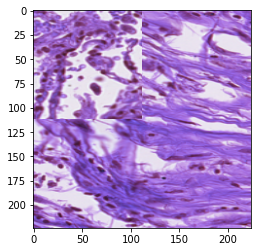

In [6]:
img = cv2.resize(cv2.imread(test_image_path_2), (224, 224))
plt.imshow(img)

In [7]:
test_image_1  = cv2.resize(cv2.imread(test_image_path_1), (224, 224))
test_image_2  = cv2.resize(cv2.imread(test_image_path_2), (224, 224))
valid_image = cv2.resize(cv2.imread(valid_image_path), (224, 224))
valid_mask  = cv2.resize(cv2.imread(valid_mask_path), (224, 224))

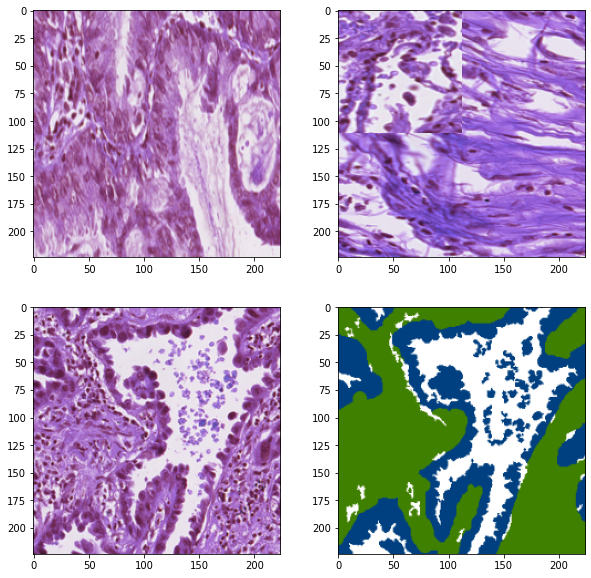

In [8]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(2, 2, 1)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 2)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 2, 3)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 2, 4)
plt.imshow(cv2.cvtColor(valid_mask, cv2.COLOR_BGR2RGB))

In [9]:
def preprocess_image(img: np.ndarray, mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], resized = (224, 224)) -> torch.Tensor:
  
  preprocessing = transforms.Compose([
                                      transforms.ToTensor(),
                                      transforms.Resize((224, 224)),
                                      transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
                                      ])
  return preprocessing(img.copy()).unsqueeze(0)

In [10]:
def reshape_transform(tensor, height=7, width=7):
  result = tensor[:, 1 :  , :].reshape(tensor.size(0),
                                       height, width, tensor.size(2))
  
  # Bring the channels to the first dimension,
  # like in CNNs.
  result = result.transpose(2, 3).transpose(1, 2)
  return result

In [114]:
def show_mask_on_image(img, mask):
    img = np.float32(img) / 255
    heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    cam = heatmap + np.float32(img)
    cam = cam / np.max(cam)
    return np.uint8(255 * cam)

# Creating models

In [11]:
cutmix_model_vit_base_patch32_224_02 = timm.create_model('vit_base_patch32_224', pretrained = True, num_classes = 3,
                                                         drop_rate = 0.2, attn_drop_rate = 0.2).to(device)

cutmix_model_vit_base_patch32_224_02.load_state_dict(torch.load(f='/content/drive/MyDrive/Newcastle University/Final Project and Dissertation/Models/cutmix_model_vit_base_patch32_224_02.pth',
                                                      map_location=torch.device(device)))

<All keys matched successfully>

In [ ]:
cutmix_model_vit_base_patch32_224_02.eval()

In [13]:
target_layer = [cutmix_model_vit_base_patch32_224_02.blocks[-1].norm1]
target_layer

[LayerNorm((768,), eps=1e-06, elementwise_affine=True)]

# Configuring images

In [14]:
test_image_1_tensor = preprocess_image(test_image_1).to(device)
test_image_2_tensor = preprocess_image(test_image_2).to(device)
valid_image_tensor  = preprocess_image(valid_image).to(device)

# GradCAM

In [15]:
cam = GradCAM(model = cutmix_model_vit_base_patch32_224_02, target_layers=target_layer,
              reshape_transform=reshape_transform)

## image 1

In [16]:
grayscale_cam1 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

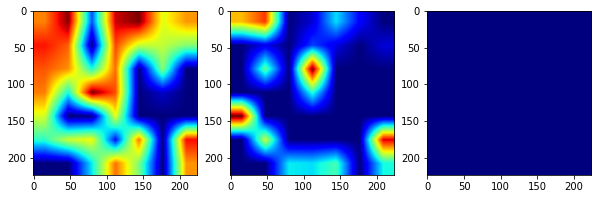

In [17]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

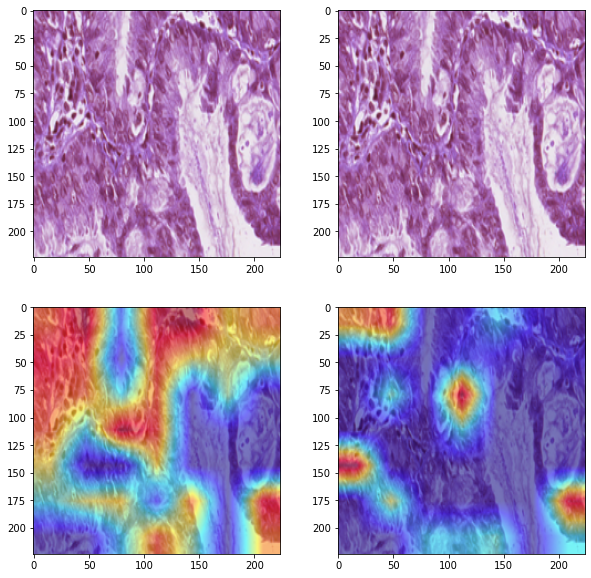

In [18]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(2, 2, 1)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 2)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 3)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 2, 4)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam2[0, :], use_rgb=True))

## image 2

In [19]:
grayscale_cam1 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

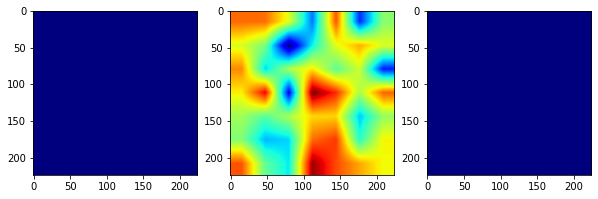

In [20]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

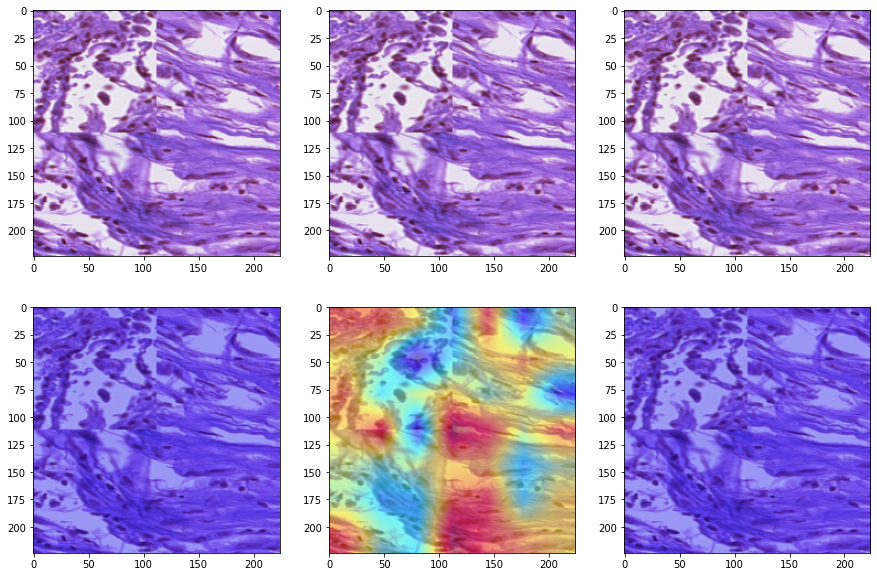

In [21]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam3[0, :], use_rgb=True))

## valid Image

In [22]:
grayscale_cam1 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

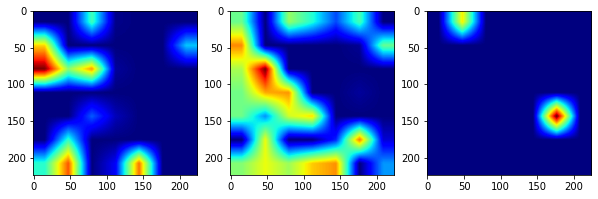

In [23]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

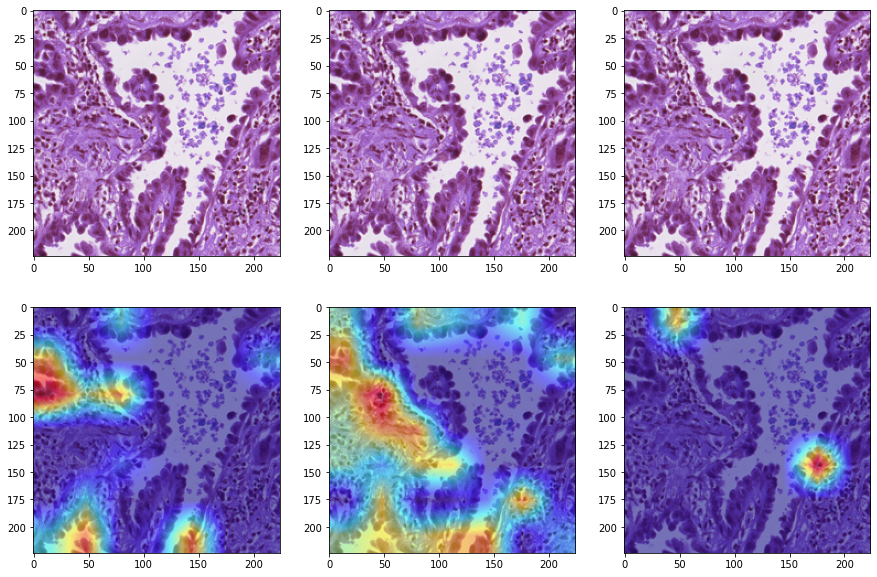

In [24]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam3[0, :], use_rgb=True))

# ScoreCAM

In [25]:
cam = ScoreCAM(model = cutmix_model_vit_base_patch32_224_02, target_layers=target_layer,
              reshape_transform=reshape_transform)

## image 1

In [26]:
grayscale_cam1 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

100%|██████████| 48/48 [02:05<00:00,  2.60s/it]


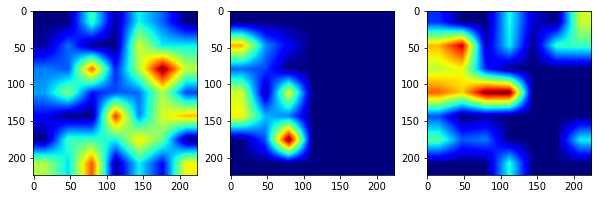

In [27]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

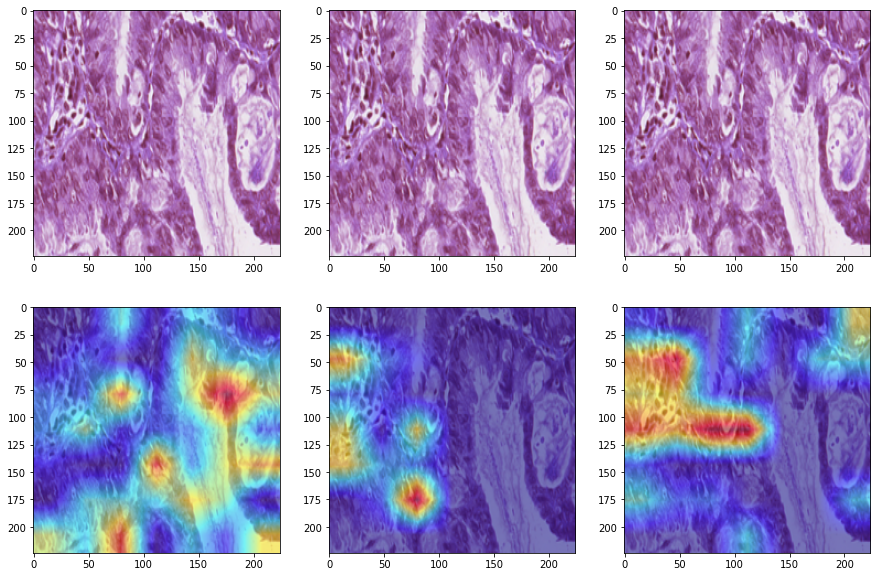

In [28]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam3[0, :], use_rgb=True))

## image 2

In [29]:
grayscale_cam1 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

100%|██████████| 48/48 [02:04<00:00,  2.60s/it]


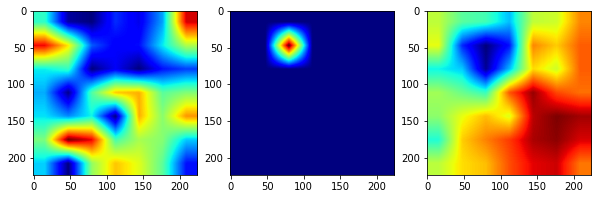

In [30]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

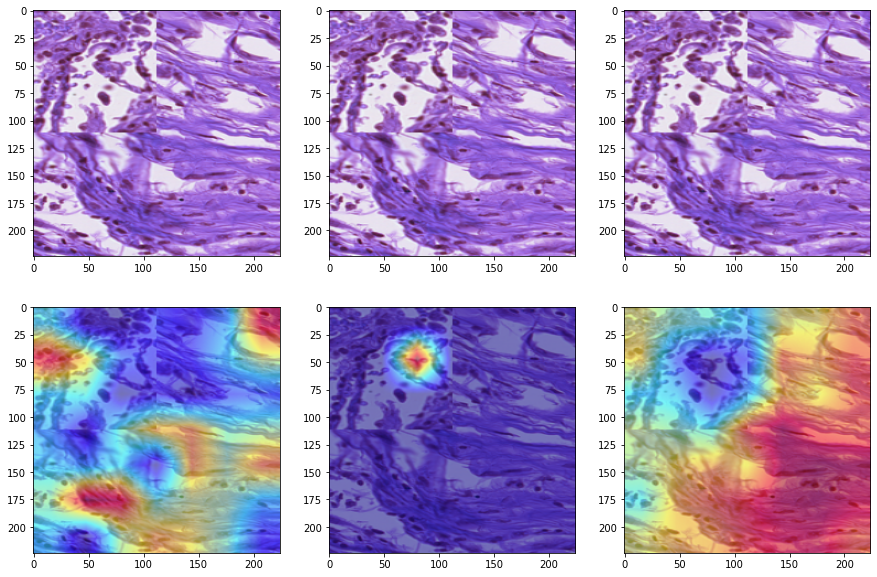

In [31]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam3[0, :], use_rgb=True))

## valid Image

In [32]:
grayscale_cam1 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

100%|██████████| 48/48 [02:02<00:00,  2.54s/it]


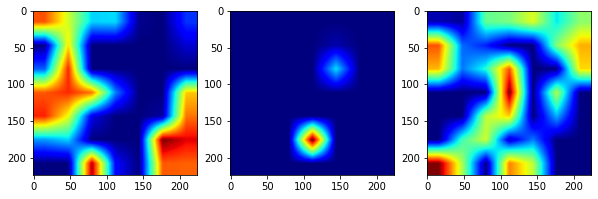

In [33]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

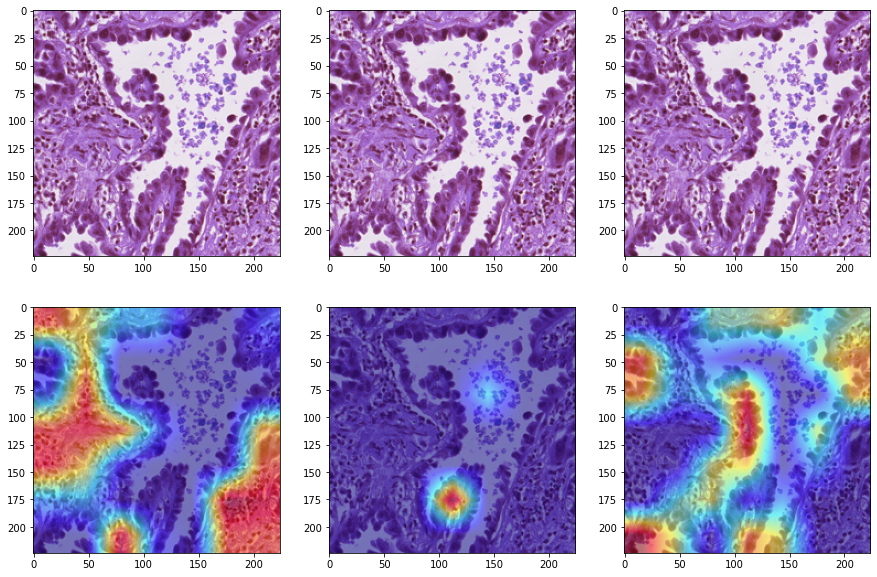

In [34]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam3[0, :], use_rgb=True))

# GradCAM++

In [35]:
cam = GradCAMPlusPlus(model = cutmix_model_vit_base_patch32_224_02, target_layers=target_layer,
                      reshape_transform=reshape_transform)

## image 1

In [36]:
grayscale_cam1 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

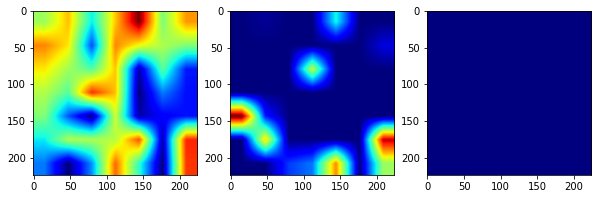

In [37]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

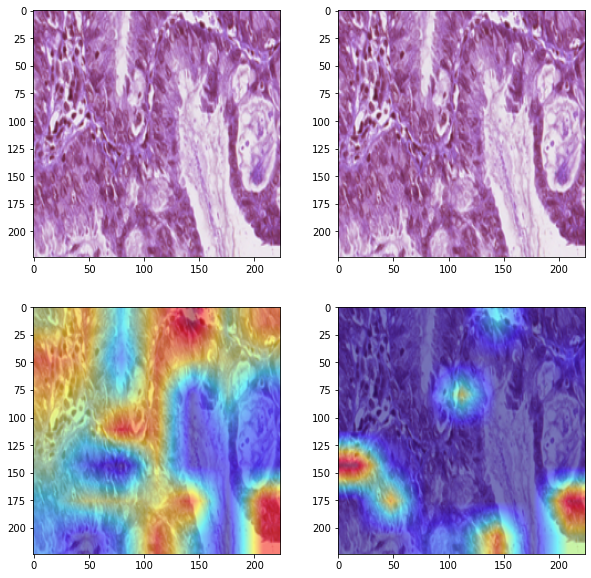

In [38]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(2, 2, 1)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 2)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 3)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 2, 4)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam2[0, :], use_rgb=True))

## image 2

In [39]:
grayscale_cam1 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

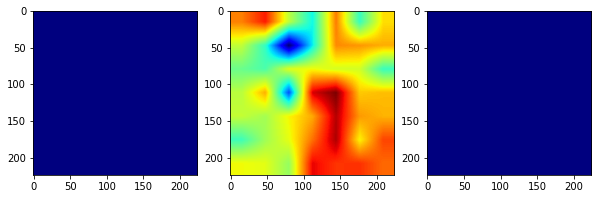

In [40]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

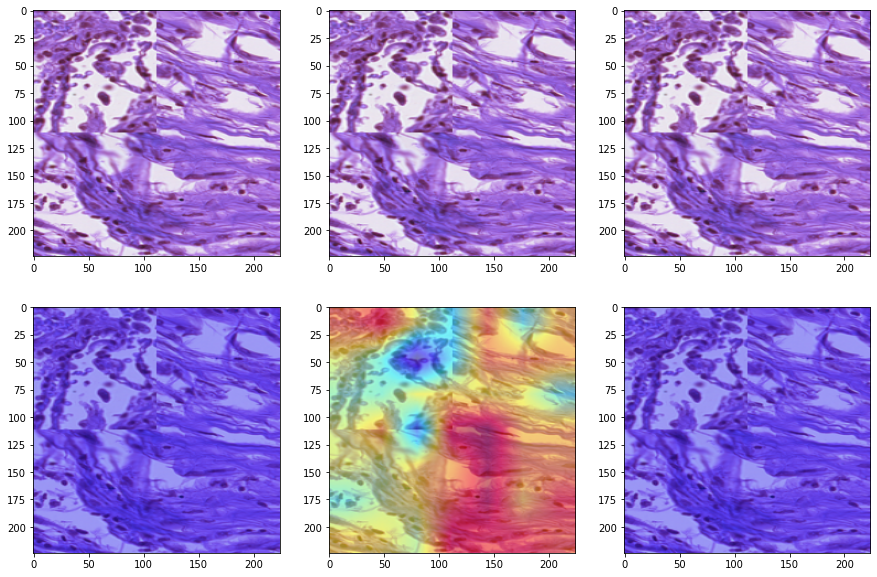

In [41]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam3[0, :], use_rgb=True))

## valid Image

In [42]:
grayscale_cam1 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

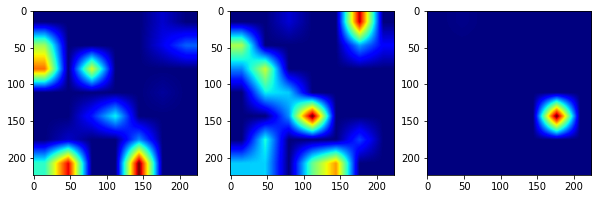

In [43]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

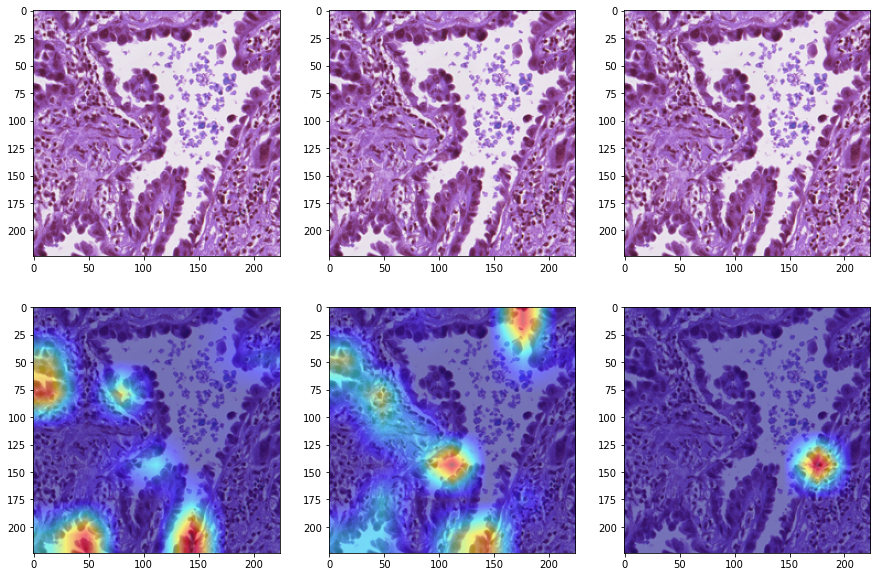

In [44]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam3[0, :], use_rgb=True))

# AblationCAM

In [45]:
from pytorch_grad_cam.ablation_layer import AblationLayerVit

In [46]:
cam = AblationCAM(model = cutmix_model_vit_base_patch32_224_02, target_layers=target_layer,
                  reshape_transform=reshape_transform, ablation_layer=AblationLayerVit())

## image 1

In [47]:
grayscale_cam1 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

100%|██████████| 24/24 [02:03<00:00,  5.13s/it]


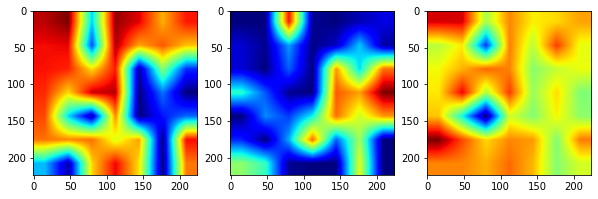

In [48]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

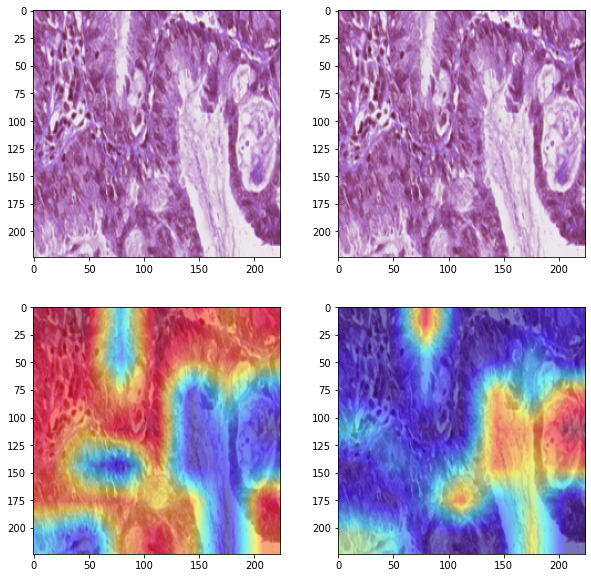

In [49]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(2, 2, 1)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 2)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 3)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 2, 4)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam2[0, :], use_rgb=True))

## image 2

In [50]:
grayscale_cam1 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

100%|██████████| 24/24 [02:03<00:00,  5.15s/it]


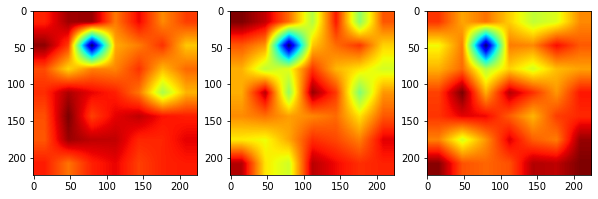

In [51]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

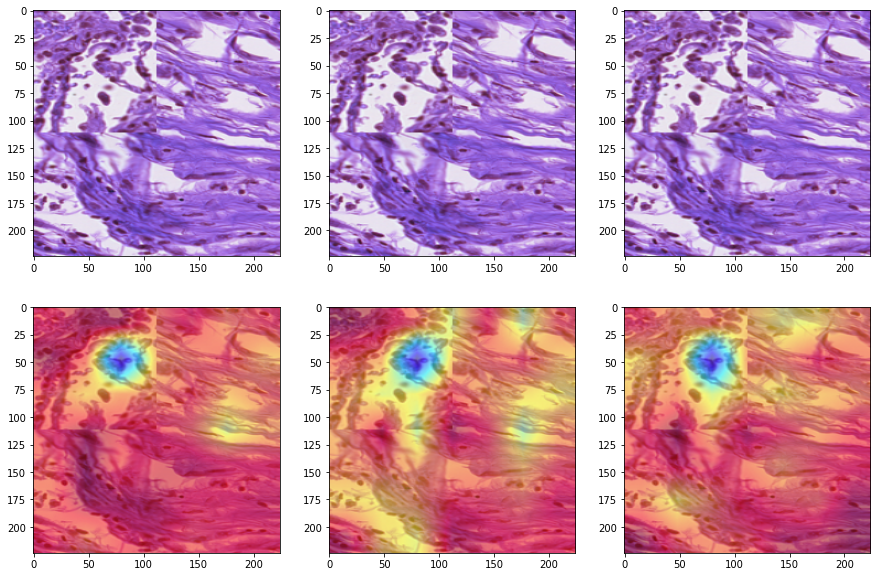

In [52]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam3[0, :], use_rgb=True))

## valid Image

In [53]:
grayscale_cam1 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

100%|██████████| 24/24 [02:13<00:00,  5.57s/it]


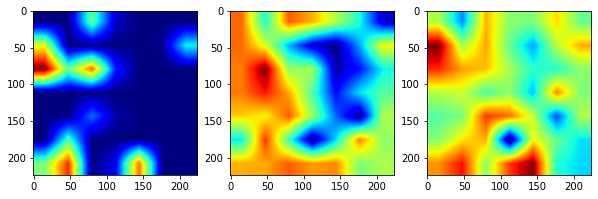

In [54]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

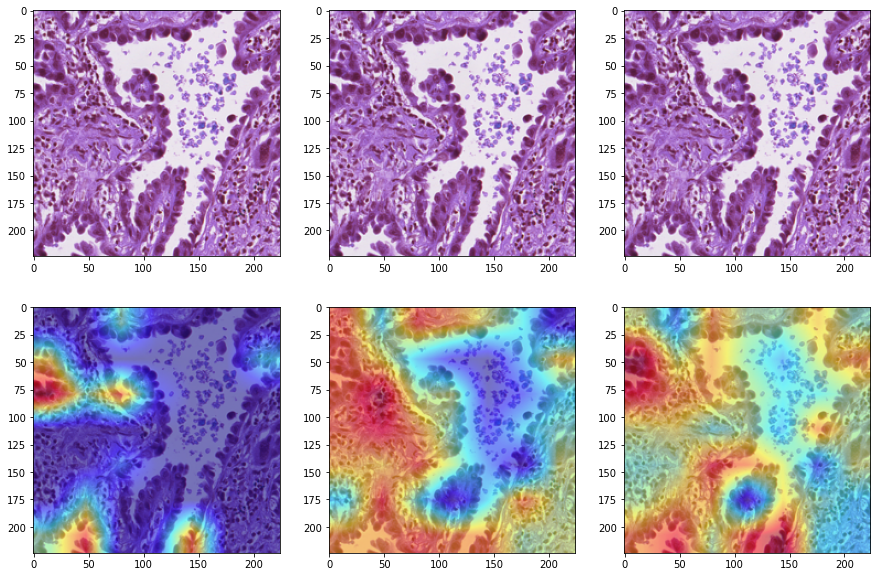

In [55]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam3[0, :], use_rgb=True))

# XGradCAM

In [56]:
cam = XGradCAM(model = cutmix_model_vit_base_patch32_224_02, target_layers=target_layer,
              reshape_transform=reshape_transform)

## image 1

In [57]:
grayscale_cam1 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

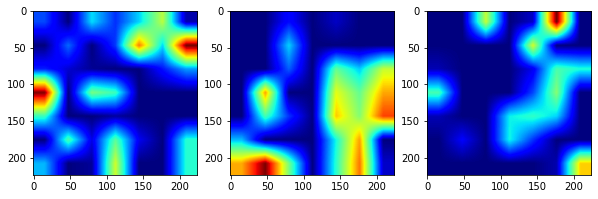

In [58]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

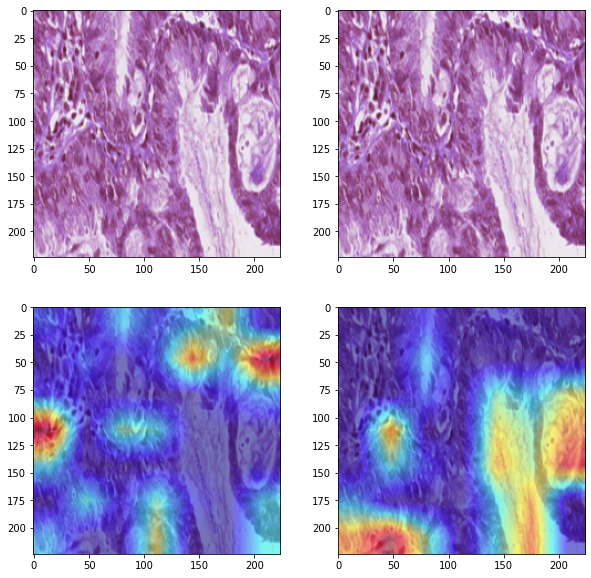

In [59]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(2, 2, 1)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 2)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 3)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 2, 4)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam2[0, :], use_rgb=True))

## image 2

In [60]:
grayscale_cam1 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

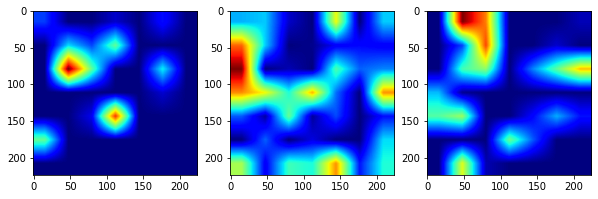

In [61]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

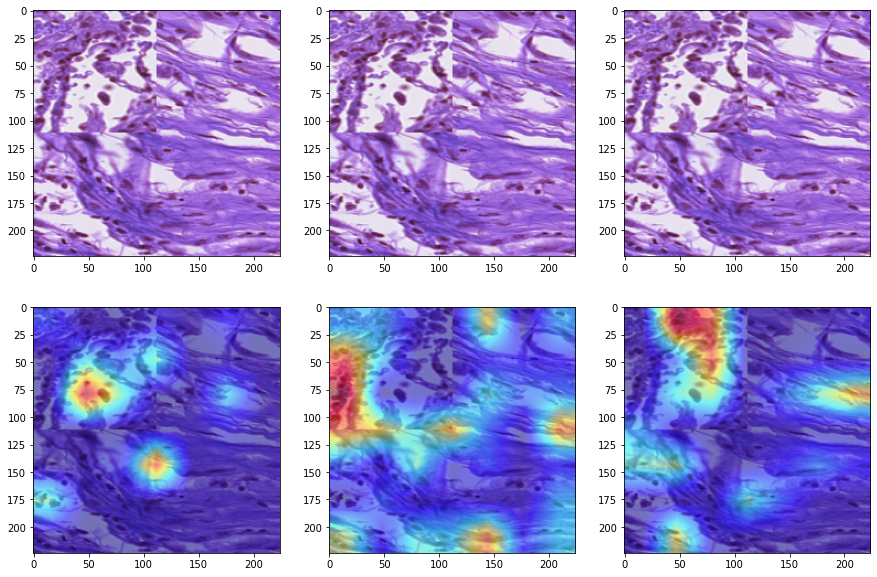

In [62]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam3[0, :], use_rgb=True))

## valid Image

In [63]:
grayscale_cam1 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

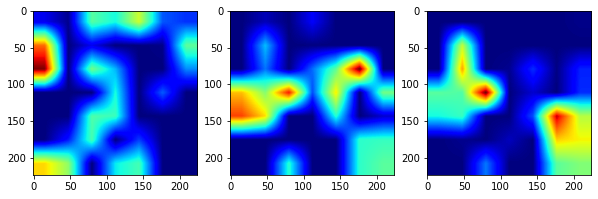

In [64]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

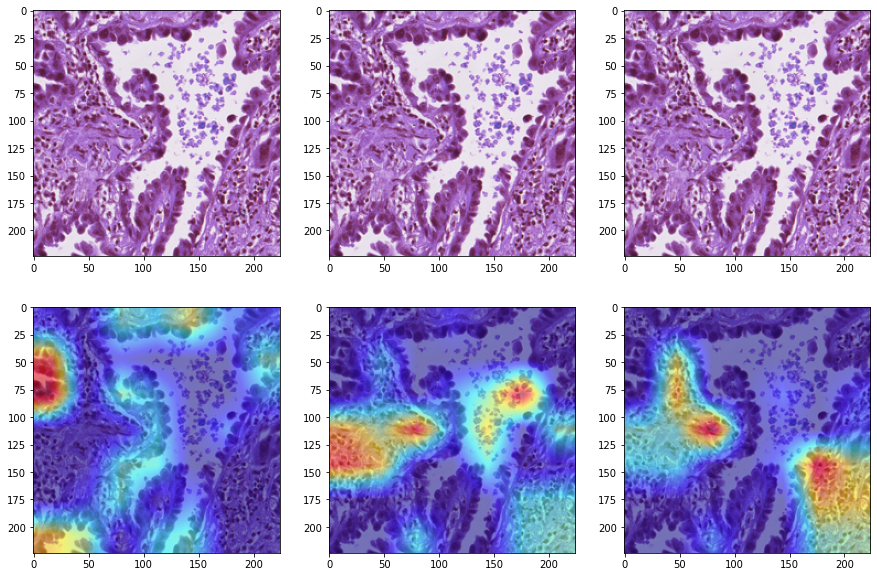

In [65]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam3[0, :], use_rgb=True))

# EigenCAM

In [66]:
cam = EigenCAM(model = cutmix_model_vit_base_patch32_224_02, target_layers=target_layer,
              reshape_transform=reshape_transform)

## image 1

In [67]:
grayscale_cam1 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

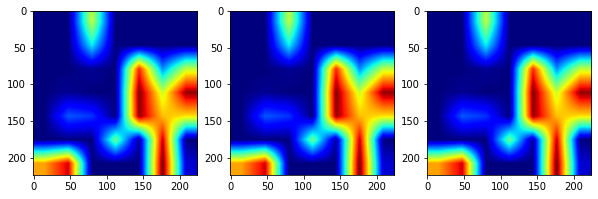

In [68]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

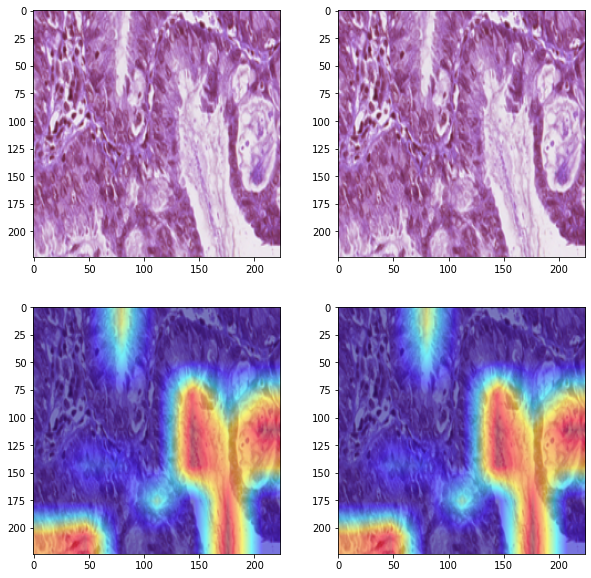

In [69]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(2, 2, 1)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 2)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 3)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 2, 4)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam2[0, :], use_rgb=True))

## image 2

In [70]:
grayscale_cam1 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

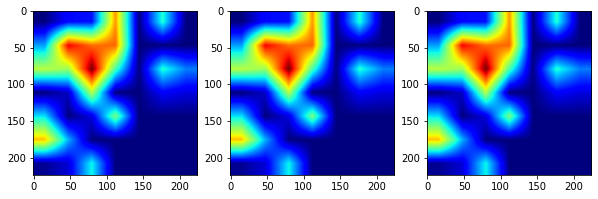

In [71]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

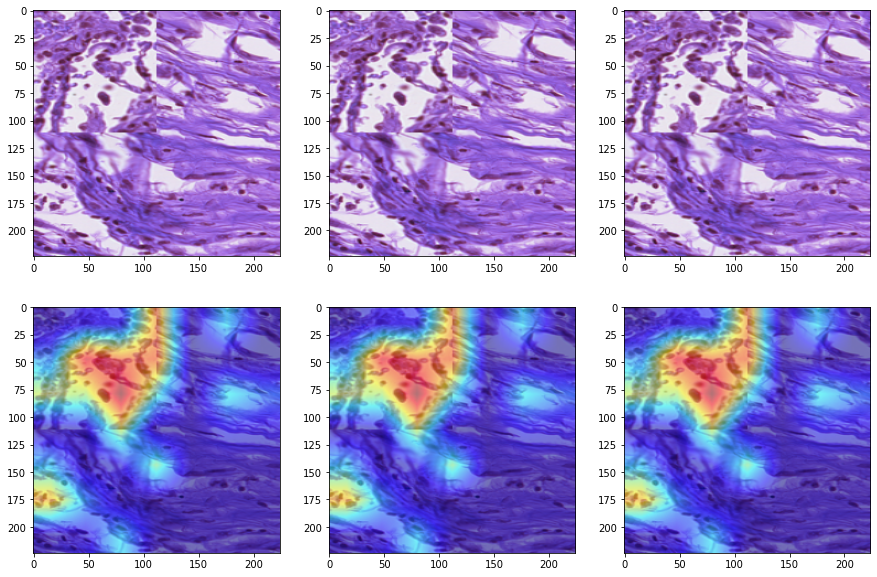

In [72]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam3[0, :], use_rgb=True))

## valid Image

In [73]:
grayscale_cam1 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

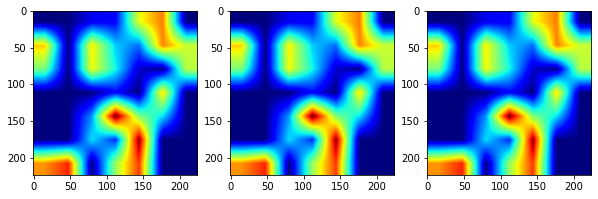

In [74]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

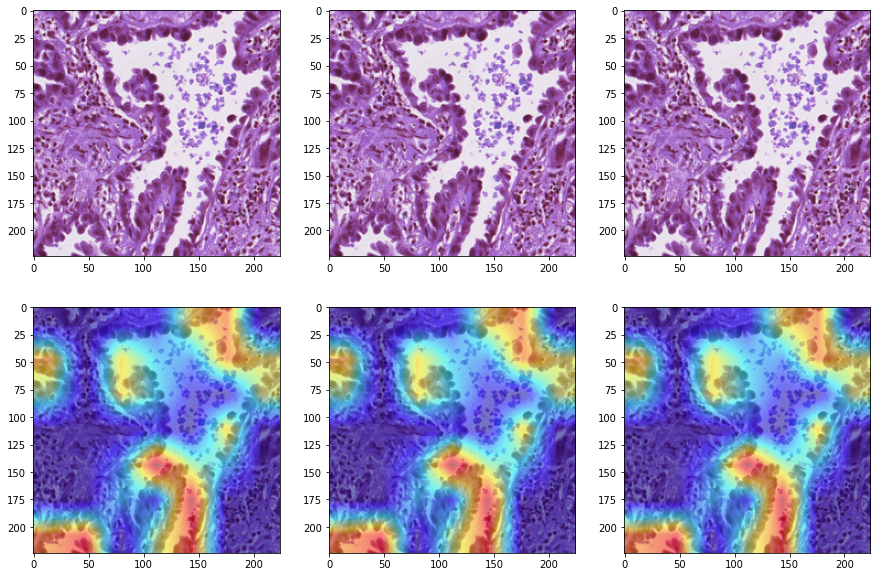

In [75]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam3[0, :], use_rgb=True))

# EigenGradCAM

In [76]:
cam = EigenGradCAM(model = cutmix_model_vit_base_patch32_224_02, target_layers=target_layer,
              reshape_transform=reshape_transform)

## image 1

In [77]:
grayscale_cam1 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

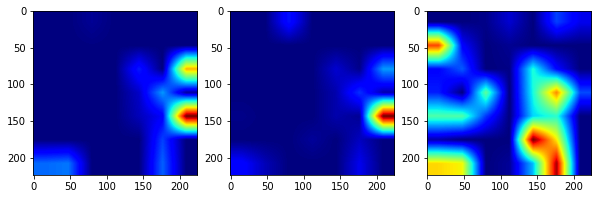

In [78]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

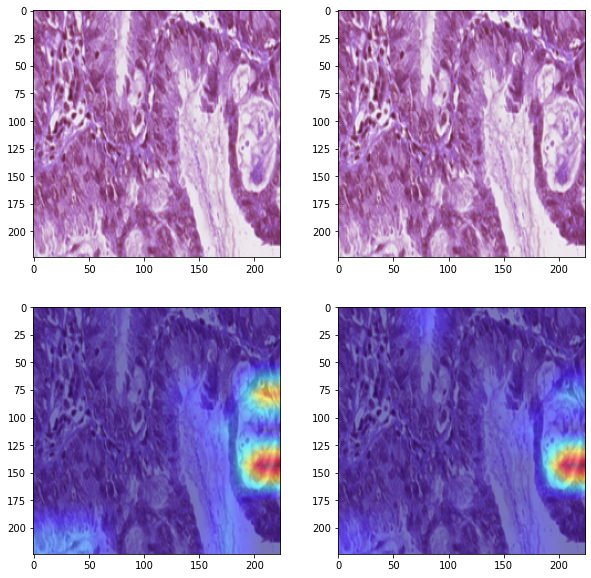

In [79]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(2, 2, 1)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 2)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 3)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 2, 4)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam2[0, :], use_rgb=True))

## image 2

In [80]:
grayscale_cam1 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

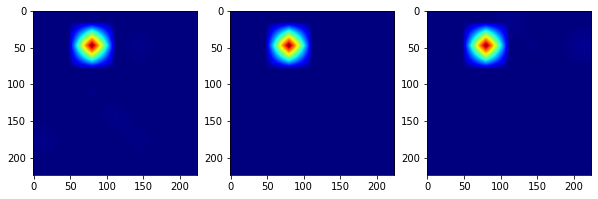

In [81]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

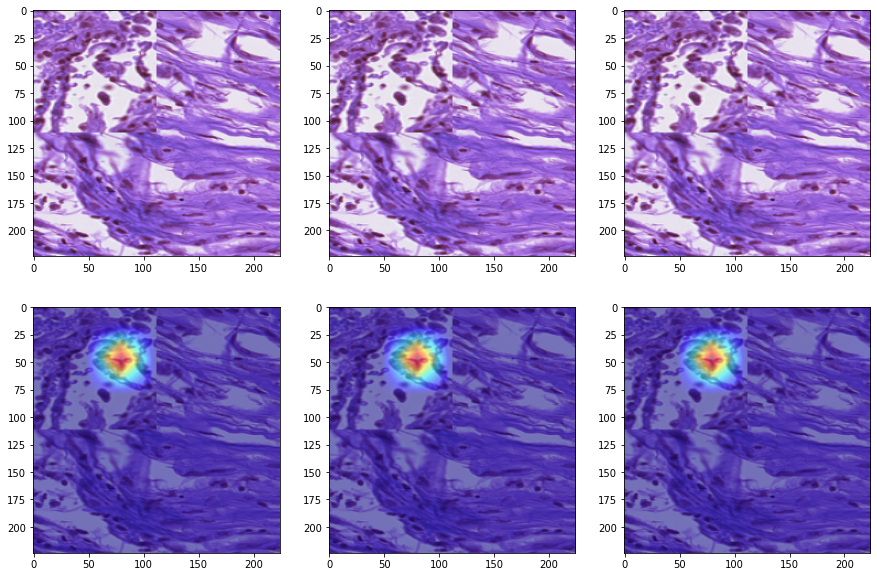

In [82]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam3[0, :], use_rgb=True))

## valid Image

In [83]:
grayscale_cam1 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

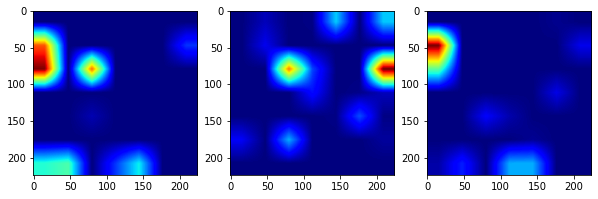

In [84]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

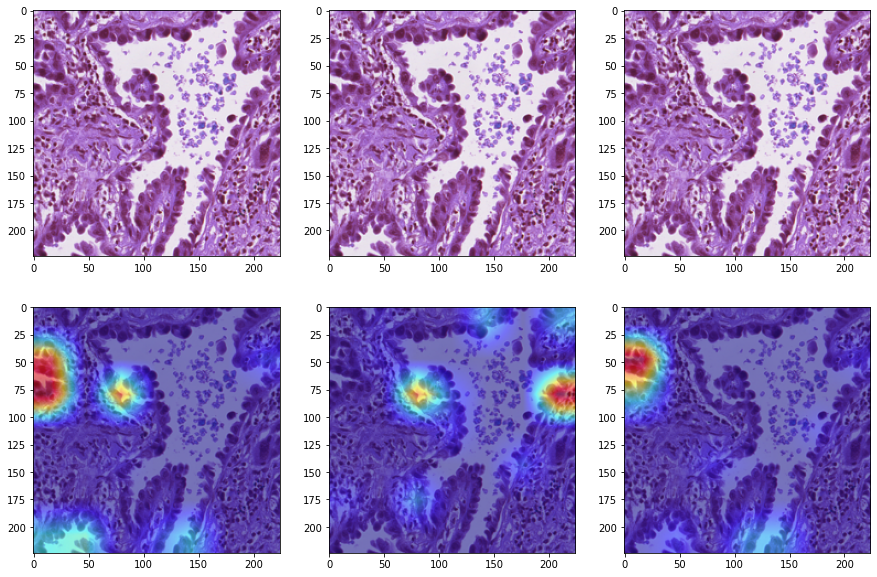

In [85]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam3[0, :], use_rgb=True))

# LayerCAM

In [86]:
cam = LayerCAM(model = cutmix_model_vit_base_patch32_224_02, target_layers=target_layer,
              reshape_transform=reshape_transform)

## image 1

In [87]:
grayscale_cam1 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

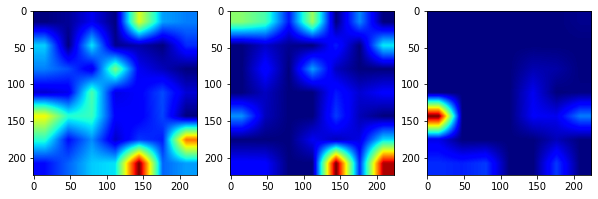

In [88]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

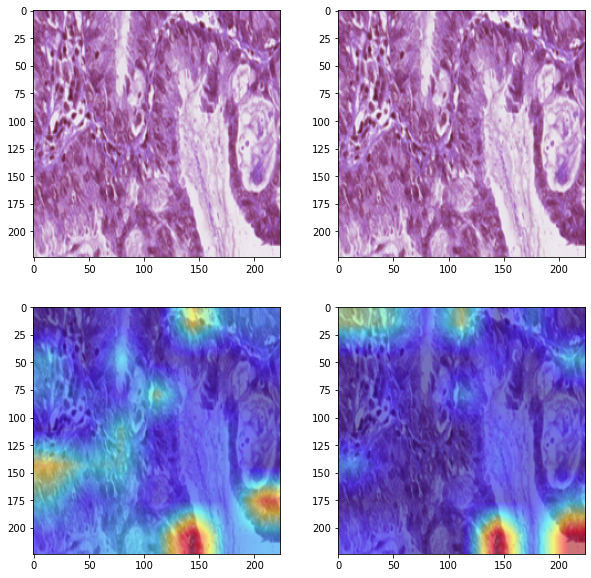

In [89]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(2, 2, 1)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 2)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 3)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 2, 4)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam2[0, :], use_rgb=True))

## image 2

In [90]:
grayscale_cam1 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

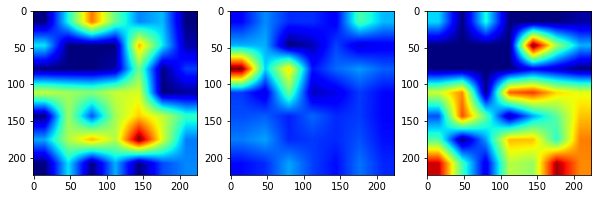

In [91]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

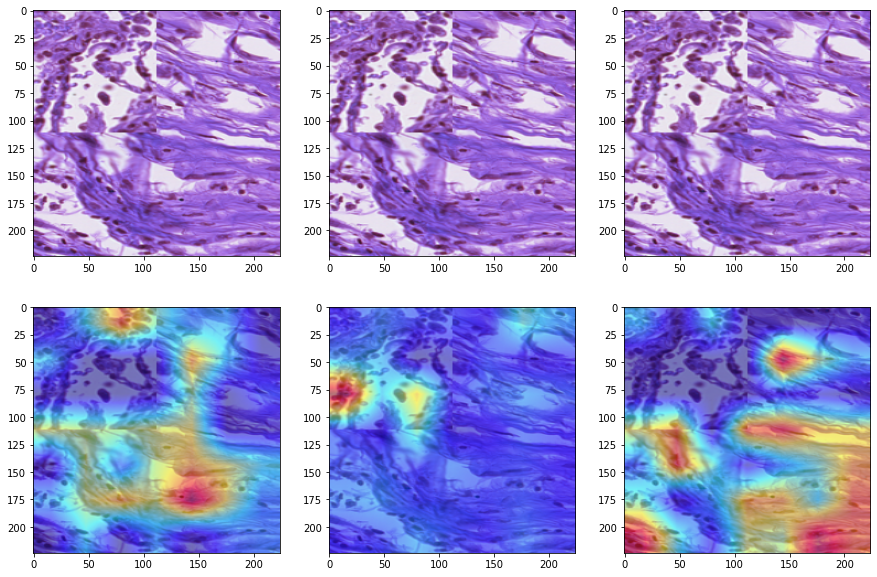

In [92]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam3[0, :], use_rgb=True))

## valid Image

In [93]:
grayscale_cam1 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

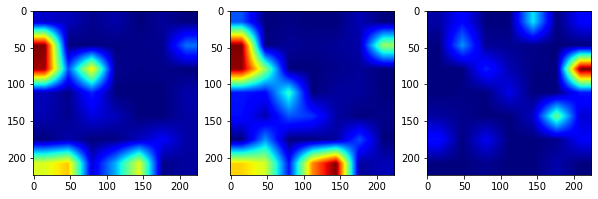

In [94]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

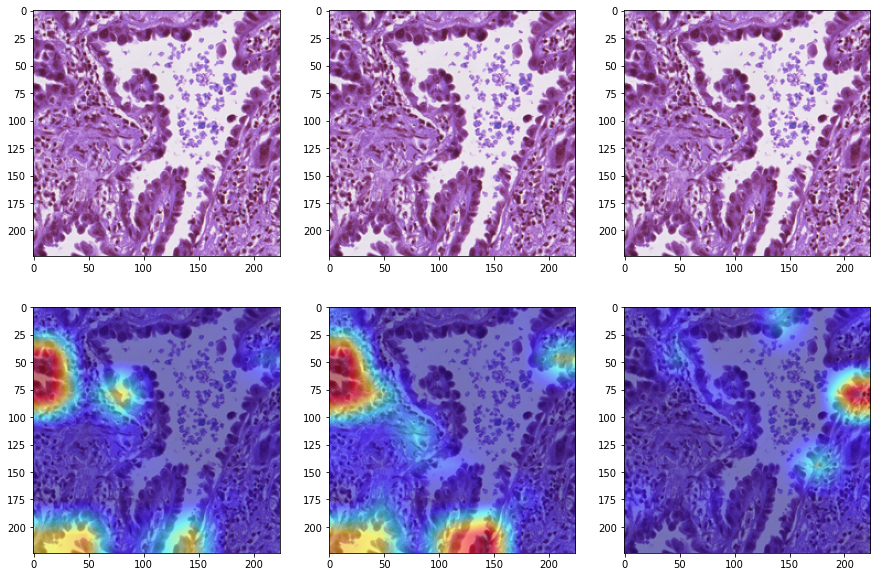

In [95]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam3[0, :], use_rgb=True))

# Attention Rollout

In [96]:
! git clone https://github.com/jacobgil/vit-explain vit_explain

Cloning into 'vit_explain'...
remote: Enumerating objects: 96, done.
remote: Counting objects: 100% (96/96), done.
remote: Compressing objects: 100% (76/76), done.
remote: Total 96 (delta 36), reused 75 (delta 19), pack-reused 0
Unpacking objects: 100% (96/96), done.


In [97]:
from vit_explain.vit_rollout import VITAttentionRollout
from vit_explain.vit_grad_rollout import VITAttentionGradRollout

# Native

In [116]:
attention_rollout = VITAttentionRollout(cutmix_model_vit_base_patch32_224_02, head_fusion='max',
                                        discard_ratio=0.9)

In [117]:
test_image_1_tensor.shape

torch.Size([1, 3, 224, 224])

## image 1

In [118]:
mask_1 = attention_rollout(test_image_1_tensor)

In [120]:
mask_1

array([[0.45718685, 0.40671343, 0.19751601, 0.4151283 , 0.4580405 ,
        0.30111936, 0.22706068],
       [0.54348207, 0.33339828, 0.08108304, 0.48803246, 0.203075  ,
        0.16755277, 0.2339554 ],
       [0.2309543 , 0.29281312, 0.20696951, 0.52567905, 0.31512585,
        0.19796742, 0.1736147 ],
       [0.20114589, 0.73259336, 0.92985797, 1.        , 0.8694643 ,
        0.17497227, 0.5553348 ],
       [0.40176806, 0.3996253 , 0.48584914, 0.71430063, 0.5093882 ,
        0.0650215 , 0.5325151 ],
       [0.35457698, 0.30363002, 0.5922772 , 0.81486136, 0.11261556,
        0.6631346 , 0.46232122],
       [0.0634284 , 0.02853514, 0.08431494, 0.21505648, 0.29111844,
        0.67231166, 0.38087165]], dtype=float32)

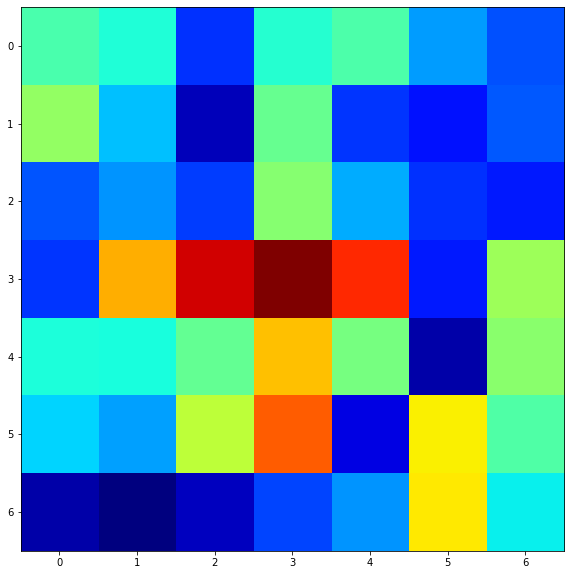

In [113]:
fig = plt.figure(figsize=(10, 10))

plt.imshow(mask_1, cmap='jet')

In [115]:
show_mask_on_image(test_image_1, mask_1)

ValueError: ignored

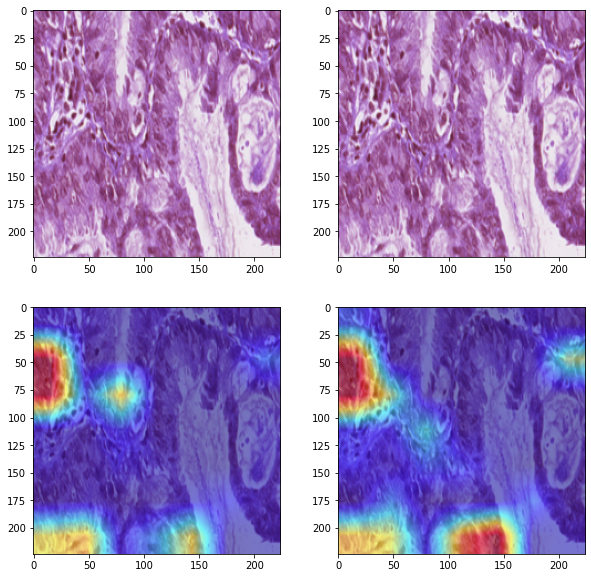

In [102]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(2, 2, 1)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 2)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 3)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 2, 4)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam2[0, :], use_rgb=True))

## image 2

In [103]:
grayscale_cam1 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

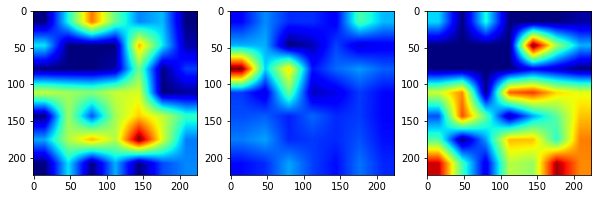

In [104]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

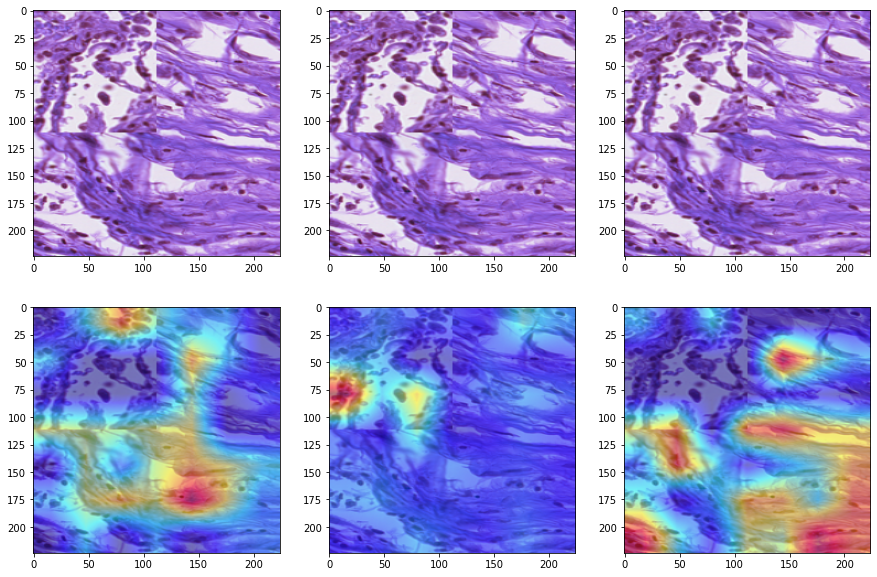

In [105]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam3[0, :], use_rgb=True))

## valid Image

In [106]:
grayscale_cam1 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

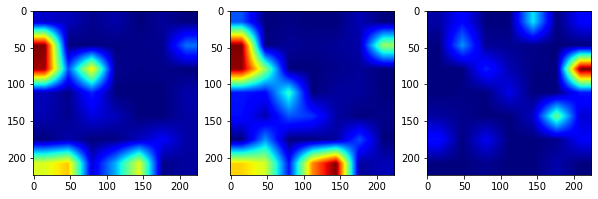

In [107]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

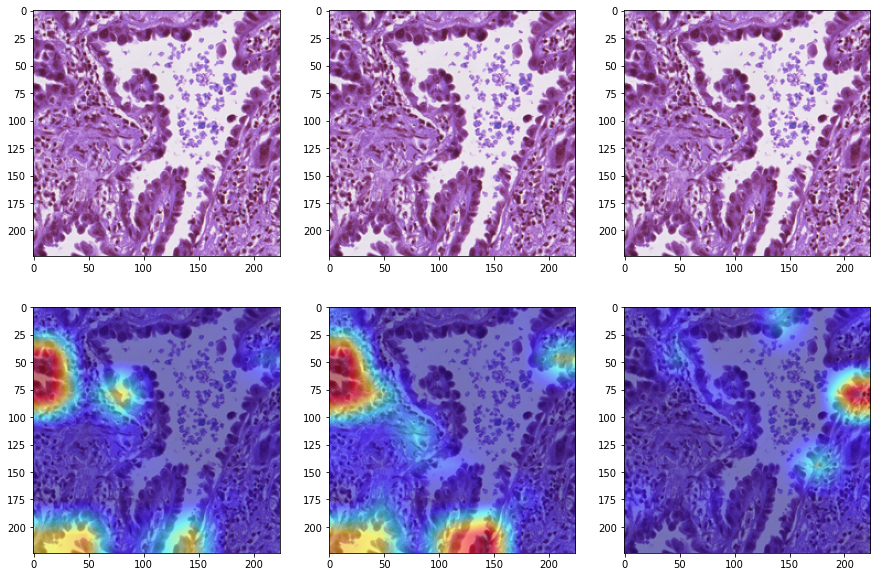

In [108]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam3[0, :], use_rgb=True))

# Grad Rollout

In [109]:
grad_rollout = VITAttentionGradRollout(cutmix_model_vit_base_patch32_224_02, discard_ratio=0.9)

In [110]:
mask_1 = grad_rollout(test_image_1_tensor, category_index=0)

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:1033: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
